In [1]:
# import libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline

from scipy.misc.pilutil import imread

In [2]:
deaths1 = pd.read_csv("/home/alex/Documents/Datas/Pubg/deaths/kill_match_stats_final_0.csv")
deaths2 = pd.read_csv("/home/alex/Documents/Datas/Pubg/deaths/kill_match_stats_final_1.csv")
deaths = pd.concat([deaths1, deaths2])

In [189]:
deaths.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26867237 entries, 0 to 13440888
Data columns (total 12 columns):
killed_by            object
killer_name          object
killer_placement     float64
killer_position_x    float64
killer_position_y    float64
map                  object
match_id             object
time                 int64
victim_name          object
victim_placement     float64
victim_position_x    float64
victim_position_y    float64
dtypes: float64(6), int64(1), object(5)
memory usage: 2.6+ GB


In [18]:
aggr1 = pd.read_csv("/home/alex/Documents/Datas/Pubg/aggr/agg_match_stats_0.csv")
aggr2 = pd.read_csv("/home/alex/Documents/Datas/Pubg/aggr/agg_match_stats_1.csv")
aggrs = pd.concat([aggr1, aggr2])

In [190]:
aggrs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27693562 entries, 0 to 13844274
Data columns (total 15 columns):
date                   object
game_size              int64
match_id               object
match_mode             object
party_size             int64
player_assists         int64
player_dbno            int64
player_dist_ride       float64
player_dist_walk       float64
player_dmg             int64
player_kills           int64
player_name            object
player_survive_time    float64
team_id                int64
team_placement         int64
dtypes: float64(3), int64(8), object(4)
memory usage: 3.3+ GB


In [134]:
deathsRed=deaths[deaths['killed_by']=='RedZone']

In [135]:
deathsRed

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
920,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmnXxPYMxq8uh3IZ_R74uPmFVfhHlxf6M3-PzR...,974,E-SportCupid,16.0,241632.0,259603.3
2256,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmlcJd06MAp1d4Q7M5Yy4PYrahIr2JBT9uhhXk...,303,ZhanFanHao,52.0,557378.8,357532.4
2868,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0Ymk9oWjnPmYXWVwfOe3D-owgLcMqizYDazwhqu...,289,doublehai,60.0,365996.9,411390.2
3142,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmldsmcWI8PBcmvfdJUtUv9LuMt1MAUqG9aDvV...,669,chijishaonianfly,26.0,398064.9,405461.8
3188,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0Ymm_5InGu4XxmbWrPJjpsdwDKldtKteYWNAiZw...,1140,Ronald27,24.0,416671.4,355207.0
3541,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmmyNWABCuuEotdFnf2pYAu3C5f-JJ9Qv-UyQV...,465,qwjmmei,41.0,377435.8,398325.4
5307,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmnNOKktVk9Qv5ZxUnnxXk1-kUI03yF8vbYyzd...,615,MadChemist5,46.0,381393.3,380992.2
5354,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmnNOKktVk9Qv5ZxUnnxXk1-kUI03yF8vbYyzd...,1052,BOODCASTER,23.0,525082.1,269445.3
6738,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmmJfFpXZ-QZQs8br_sVYD6XGe3CDoGgnAM66k...,917,xi-gua-007,39.0,440940.8,468279.5
7526,RedZone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0Ymlw1Lc2XCM3sz74zcx9pefmibUVaqMFpo6Q9T...,845,pingdandege,17.0,628977.1,367249.0


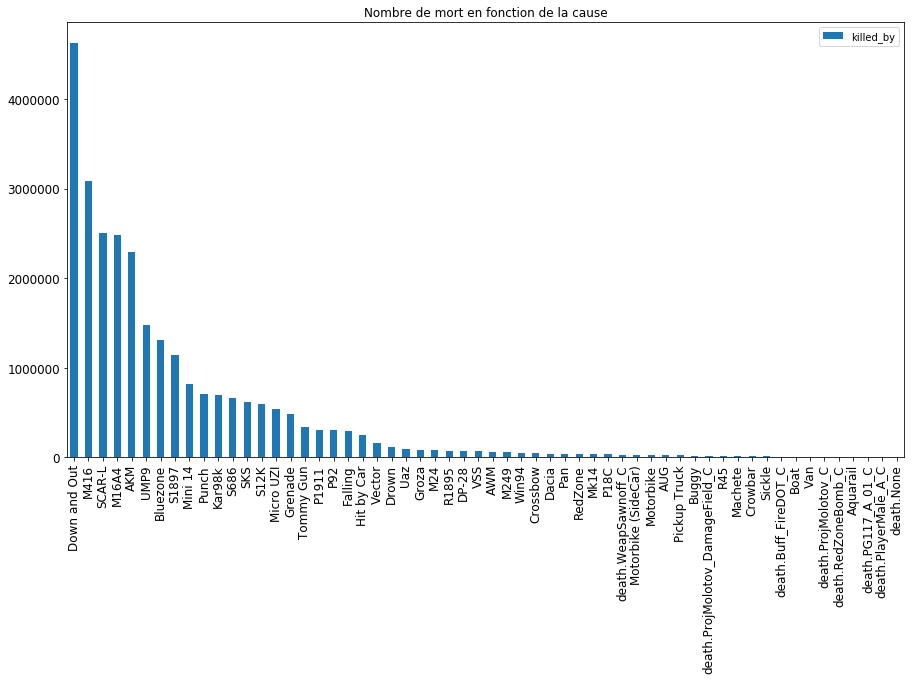

In [192]:
pd.value_counts(deaths['killed_by']).plot(kind='bar', title ="Nombre de mort en fonction de la cause",
                                               figsize=(15, 8), legend=True, fontsize=12)

## On coupe les données par rapport à chaque map

In [ ]:
# restrict to miramar
miramar = deaths[deaths["map"] == "MIRAMAR"]
erangel = deaths[deaths["map"] == "ERANGEL"]

### On fait correspondre les images aux positions

In [8]:
# scale positions to size of miramar.jpg = 1000x1000 and erangel.jpg = 4096x4096
position_data = ["killer_position_x","killer_position_y","victim_position_x","victim_position_y"]
for position in position_data:
    miramar[position] = miramar[position].apply(lambda x: x*1000/819200)
    miramar = miramar[miramar[position] != 0]
    
    erangel[position] = erangel[position].apply(lambda x: x*4096/812800)
    erangel = erangel[erangel[position] != 0]

/home/alex/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/alex/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


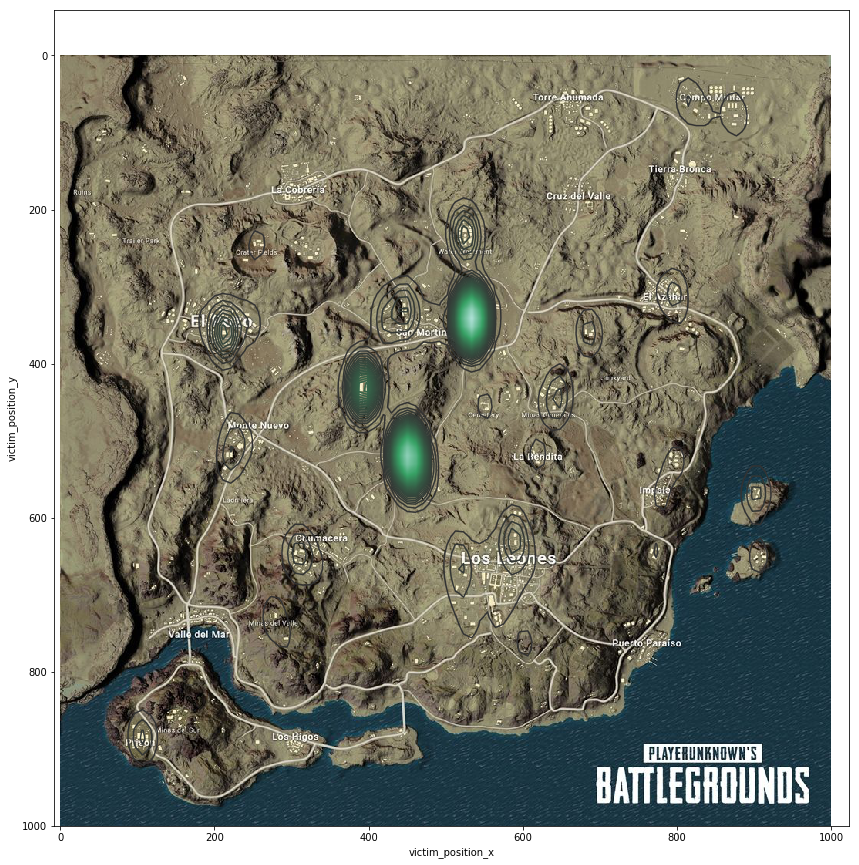

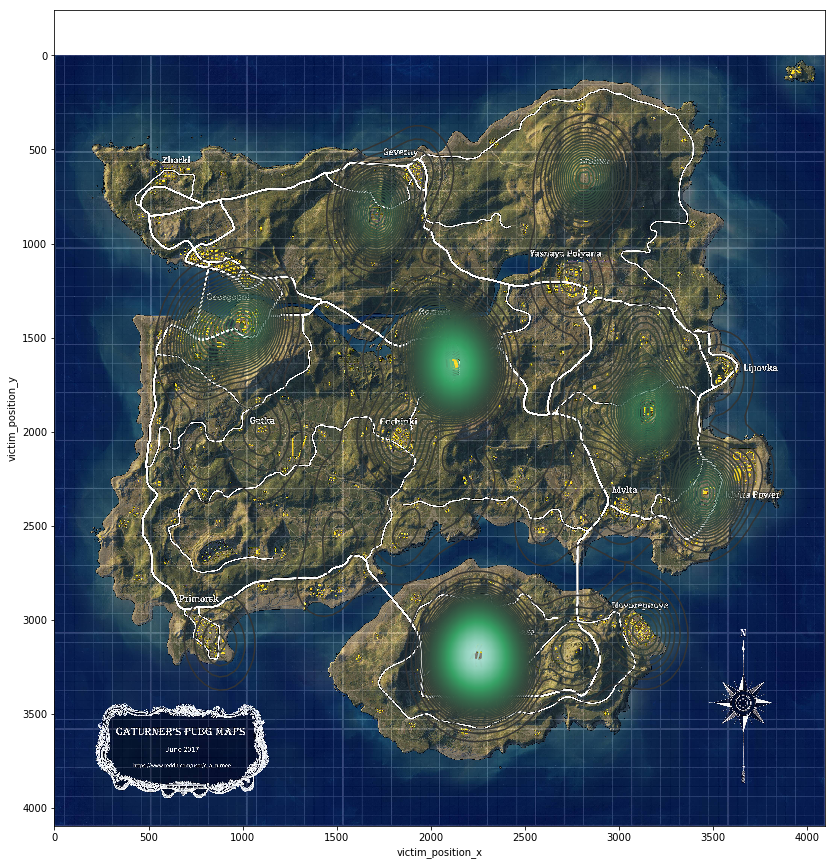

In [9]:
# select random sample of early deaths = deaths in the first 2 minutes 
# restrict to n, so that kdeplot doesn't take too long
n = 10000
mira_sample = miramar[miramar["time"] < 100].sample(n)
eran_sample = erangel[erangel["time"] < 100].sample(n)

# heatmap of mira
bg = imread("/home/alex/Documents/Datas/Pubg/miramar.jpg")
fig, ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(bg)
sns.kdeplot(mira_sample["victim_position_x"], mira_sample["victim_position_y"], n_levels=100)

# heatmap of eran
bg = imread("/home/alex/Documents/Datas/Pubg//erangel.jpg")
fig, ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(bg)
sns.kdeplot(eran_sample["victim_position_x"], eran_sample["victim_position_y"], n_levels=100)

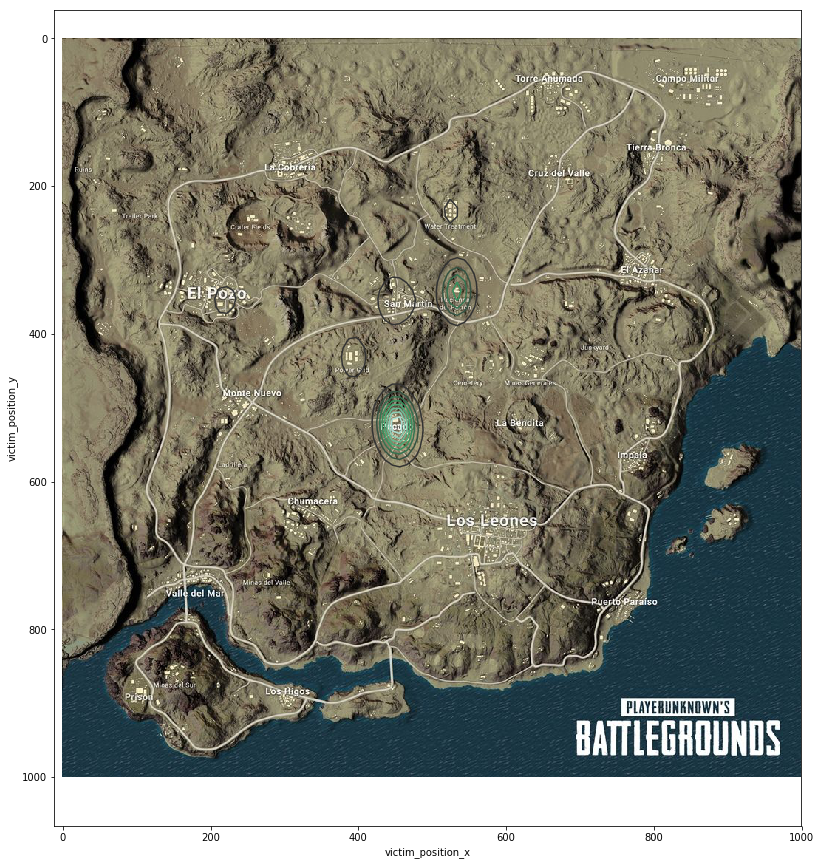

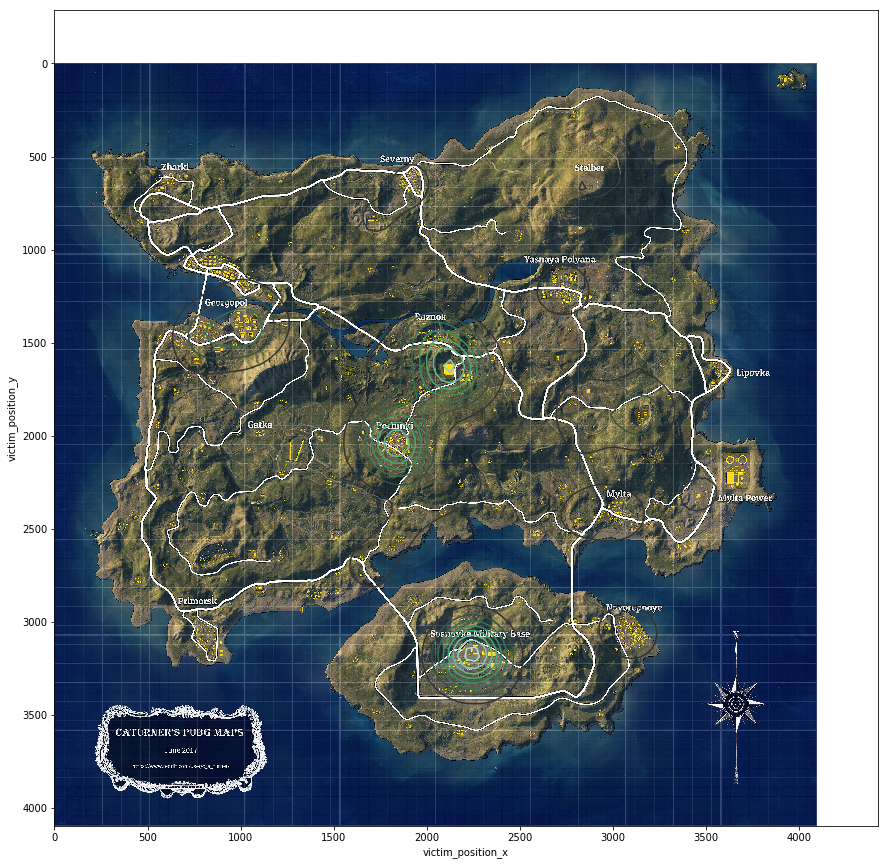

In [10]:
# select random sample of early deaths = deaths in the first 2 minutes 
# restrict to n, so that kdeplot doesn't take too long
n = 10000
mira_sample = miramar[miramar["time"] < 1000].sample(n)
eran_sample = erangel[erangel["time"] < 1000].sample(n)

# heatmap of mira
bg = imread("/home/alex/Documents/Datas/Pubg/miramar.jpg")
fig, ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(bg)
sns.kdeplot(mira_sample["victim_position_x"], mira_sample["victim_position_y"], n_levels=10)

# heatmap of eran
bg = imread("/home/alex/Documents/Datas/Pubg//erangel.jpg")
fig, ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(bg)
sns.kdeplot(eran_sample["victim_position_x"], eran_sample["victim_position_y"], n_levels=10)

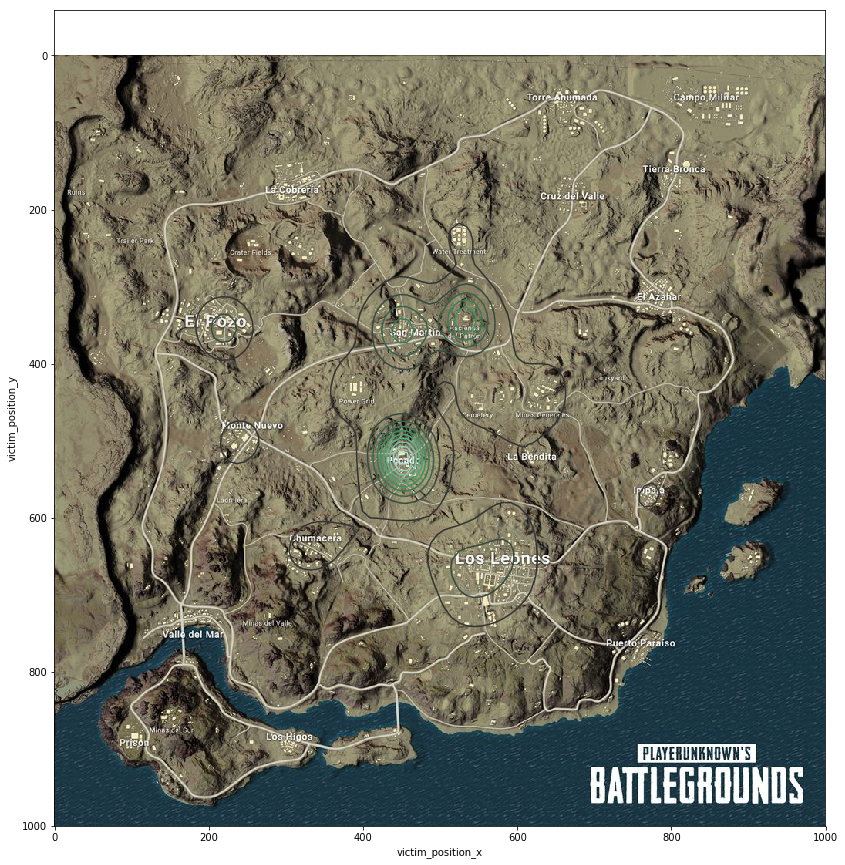

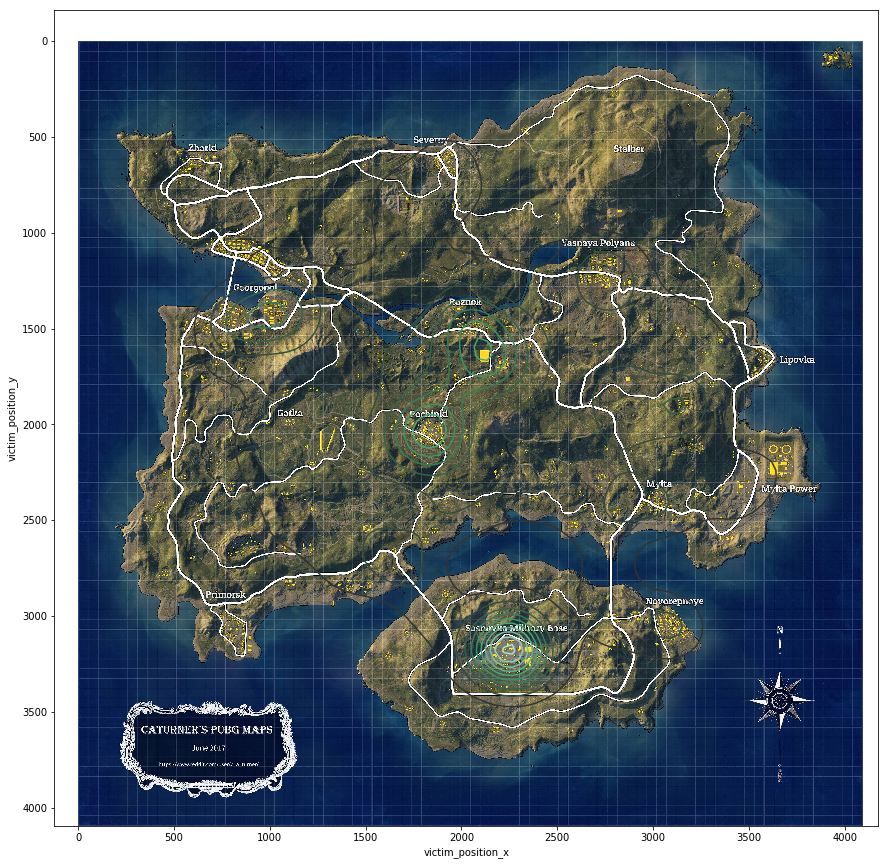

In [20]:
# select random sample of early deaths = deaths in the first 2 minutes 
# restrict to n, so that kdeplot doesn't take too long


#eran_sample = erangel[erangel["killed_by"].isin(['two','four']].sample(n)


n = 10000
mira_sample = miramar[miramar["killed_by"].isin(['M416'])].sample(n)
eran_sample = erangel[erangel["killed_by"].isin(['M416'])].sample(n)

# heatmap of mira
bg = imread("/home/alex/Documents/Datas/Pubg/miramar.jpg")
fig, ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(bg)
sns.kdeplot(mira_sample["victim_position_x"], mira_sample["victim_position_y"], n_levels=10)

# heatmap of eran
bg = imread("/home/alex/Documents/Datas/Pubg//erangel.jpg")
fig, ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(bg)
sns.kdeplot(eran_sample["victim_position_x"], eran_sample["victim_position_y"], n_levels=10)

In [34]:
# select random sample of early deaths = deaths in the first 2 minutes 
# restrict to n, so that kdeplot doesn't take too long


#eran_sample = erangel[erangel["killed_by"].isin(['two','four']].sample(n)


n = 10000


mira_sample2 = miramar[miramar["killed_by"].isin(['Punch'])]
eran_sample2 = erangel[erangel["killed_by"].isin(['Punch'])]

mira_sample = mira_sample2[mira_sample2["time"] < 100]
eran_sample = eran_sample2[eran_sample2["time"] < 100]



In [35]:
mira_sample

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
9855,Punch,CN-wh,5.0,445.464600,334.871094,MIRAMAR,2U4GBNA0YmkFLnx7v1qJOXe27L8Ad0WzDI8KGJ8ps9zZJJ...,94,jx9286645,25.0,445.507935,334.774414
10086,Punch,Kypro,27.0,531.842529,338.685547,MIRAMAR,2U4GBNA0YmlVEJH40yYUJYj_0fbnj6ni40IVXYoVrcz3AL...,99,Rose0nly,22.0,534.368408,339.116455
12859,Punch,Gamingblitz13,76.0,528.453125,339.739502,MIRAMAR,2U4GBNA0YmlMBkU4uV1PHlE8qq8DQDypOsZ9C9D7iZlZuV...,85,KK-bg,83.0,528.499512,339.881592
13175,Punch,BeaverFucker,10.0,665.613525,67.798621,MIRAMAR,2U4GBNA0YmnoW8afpHFqvydQuLzOCEJkMcGJZvC0XfmIBD...,72,add222222,90.0,665.400757,67.733435
14764,Punch,Apulu,25.0,763.774048,295.212402,MIRAMAR,2U4GBNA0Ymk6rGUJleEA5-7YZ7adS4cC6kqYEzPhF3e96p...,93,dasixiaoaji,31.0,763.717163,295.140381
15921,Punch,Yi-yiyi,8.0,450.308228,515.003052,MIRAMAR,2U4GBNA0Ymlxl524wG6ZeDOfYymSDppRyIcRUIcRNciJAg...,96,#unknown,19.0,450.342163,515.094238
20245,Punch,WhoRUUUUU,8.0,234.581055,508.945312,MIRAMAR,2U4GBNA0YmkVHZCv0oRBCR7ohJcoNEJZ1KxXLakEHxnpsW...,99,YK_danan,25.0,234.487305,509.022949
25423,Punch,RING3R,90.0,453.312988,529.604492,MIRAMAR,2U4GBNA0YmmSqhs1Q3P8z0A1AN20PzxJXPAzr5DXN_GgX4...,98,Durimz,94.0,453.427979,529.494019
25539,Punch,Emrys1,21.0,534.591187,343.671997,MIRAMAR,2U4GBNA0YmmSP3cpzTd-S2HrPt2C7Auws4So1_Q_30okzB...,92,C102001,25.0,534.575195,343.788574
25556,Punch,zhuzhuwen113,18.0,540.386719,345.773315,MIRAMAR,2U4GBNA0YmmSP3cpzTd-S2HrPt2C7Auws4So1_Q_30okzB...,91,WP_Xiaowen,24.0,540.518677,345.781006


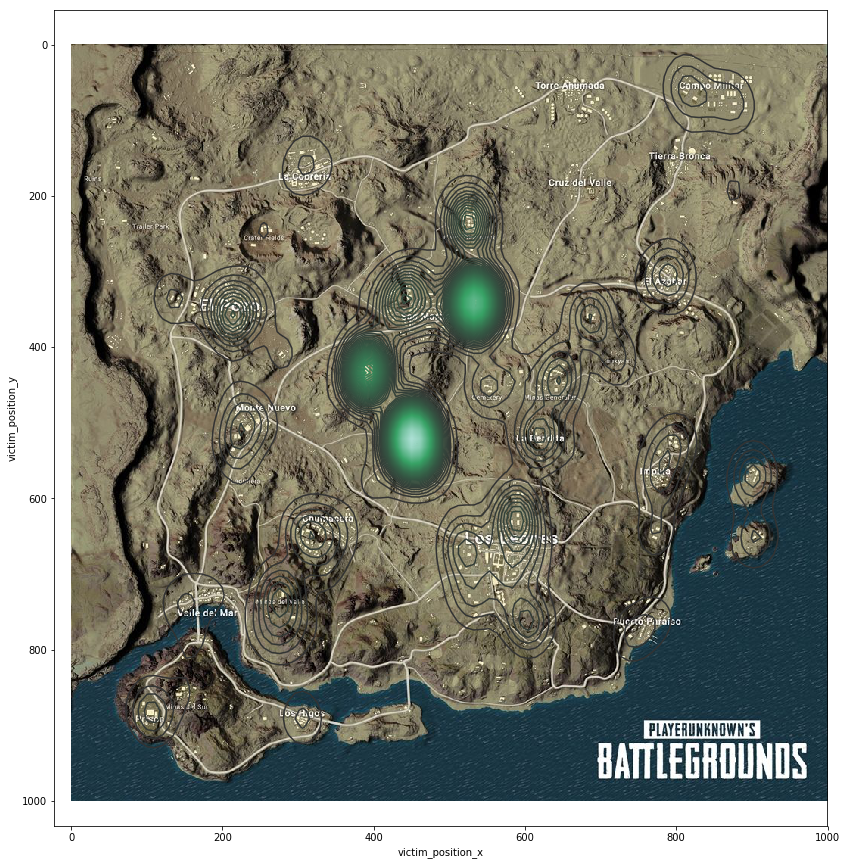

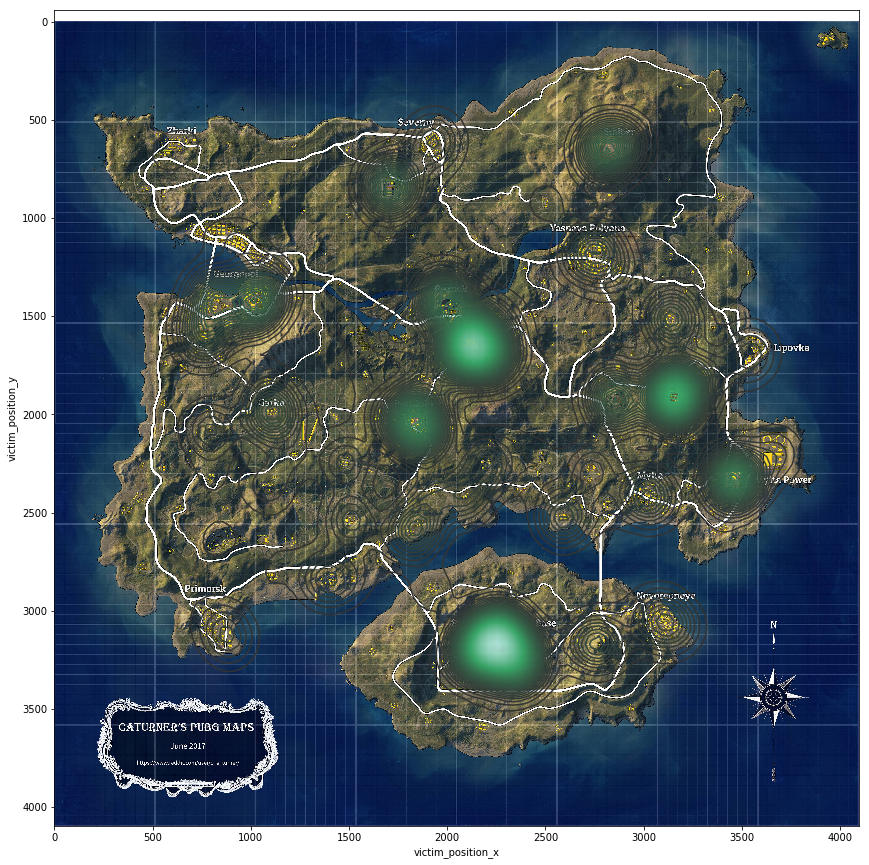

In [36]:

# heatmap of mira
bg = imread("/home/alex/Documents/Datas/Pubg/miramar.jpg")
fig, ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(bg)
sns.kdeplot(mira_sample["victim_position_x"], mira_sample["victim_position_y"], n_levels=100)

# heatmap of eran
bg = imread("/home/alex/Documents/Datas/Pubg//erangel.jpg")
fig, ax = plt.subplots(1,1,figsize=(15,15))
ax.imshow(bg)
sns.kdeplot(eran_sample["victim_position_x"], eran_sample["victim_position_y"], n_levels=100)

In [ ]:
#Kill en fonction du temps


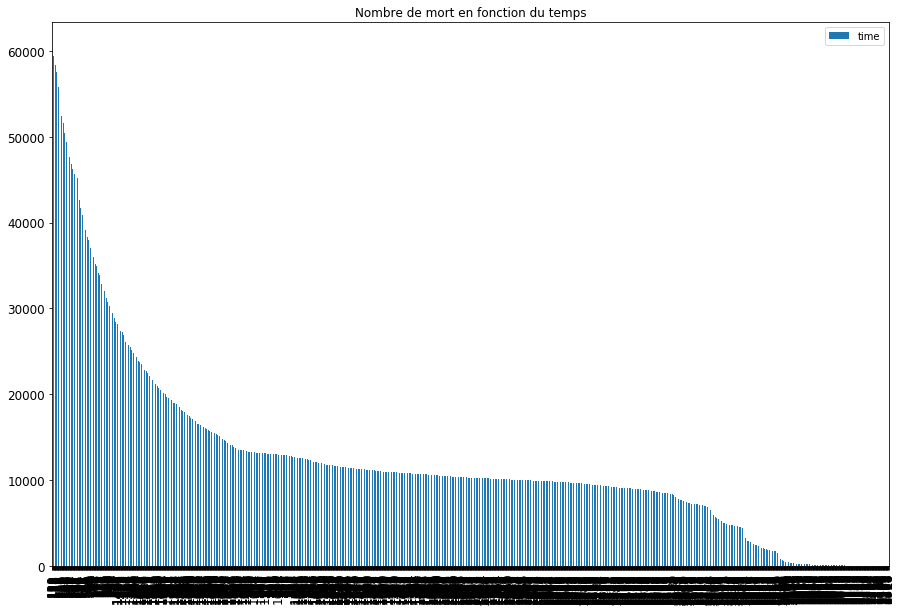

In [7]:
ax = pd.value_counts(deaths['time']).plot(kind='bar', title ="Nombre de mort en fonction du temps", figsize=(15, 10), legend=True, fontsize=12)

plt.show()

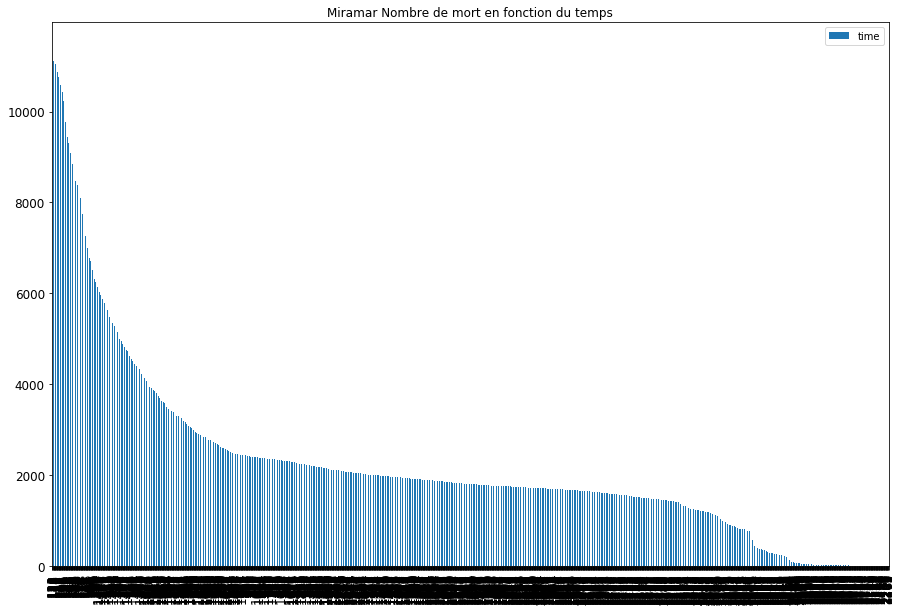

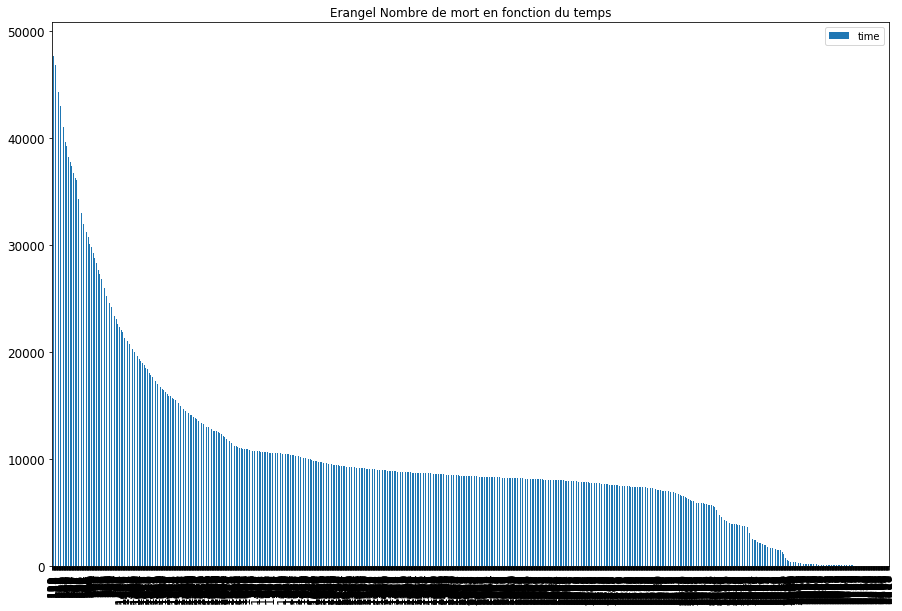

In [11]:
# restrict to miramar
miramar = deaths[deaths["map"] == "MIRAMAR"]
erangel = deaths[deaths["map"] == "ERANGEL"]

#Mira
ax = pd.value_counts(miramar['time']).plot(kind='bar', title ="Miramar Nombre de mort en fonction du temps",
                                           figsize=(15, 10), legend=True, fontsize=12)

plt.show()


#Eran

ax = pd.value_counts(erangel['time']).plot(kind='bar', title ="Erangel Nombre de mort en fonction du temps",
                                           figsize=(15, 10), legend=True, fontsize=12)

plt.show()

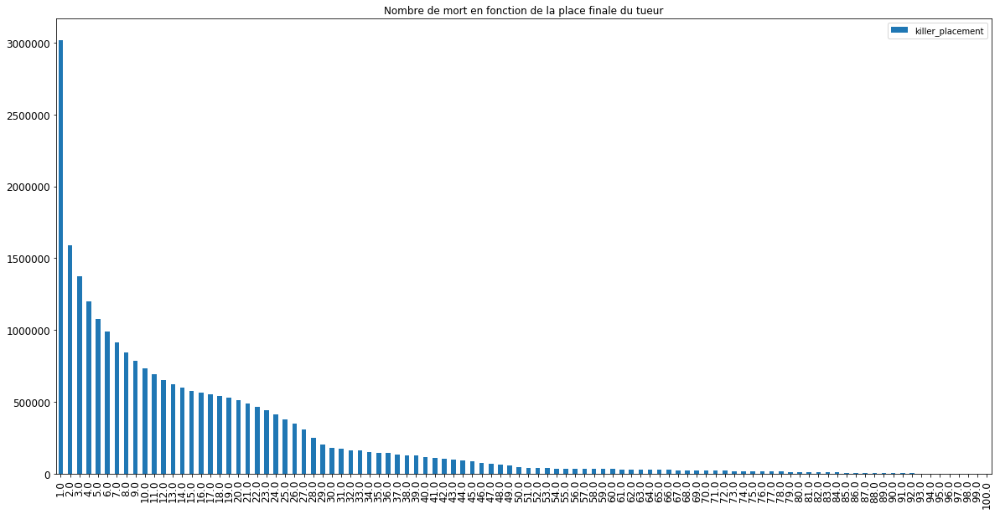

In [14]:
ax = pd.value_counts(deaths['killer_placement']).plot(kind='bar', title ="Nombre de mort en fonction de la place finale du tueur",
                                                      figsize=(20, 10), legend=True, fontsize=12)

plt.show()

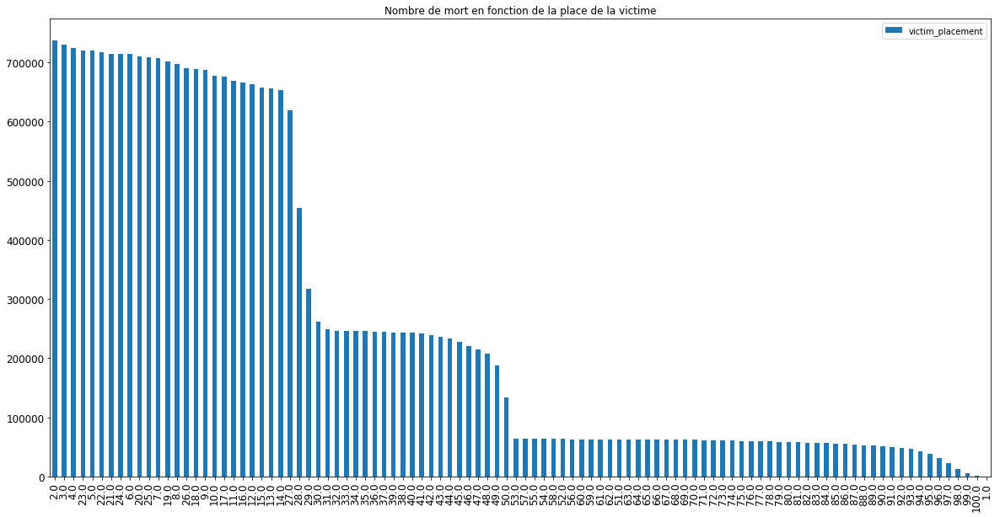

In [15]:
ax = pd.value_counts(deaths['victim_placement']).plot(kind='bar',
                                                      title ="Nombre de mort en fonction de la place de la victime",
                                                      figsize=(20, 10), legend=True, fontsize=12)

plt.show()

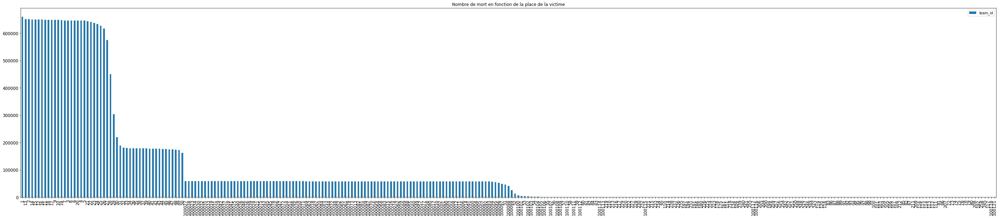

In [23]:
ax = pd.value_counts(aggrs['team_id']).plot(kind='bar',
                                                      title ="Nombre de mort en fonction de la place de la victime",
                                                      figsize=(50, 10), legend=True, fontsize=12)

plt.show()

In [21]:
aggrs.team_id.unique()

array([     4,      5,     14,     15,     17,     22,     24,     25,
           26,     29,     32,     33,     37,     38,     39,     43,
           46,     48,     50,      3,      6,     18,     23,     27,
           34,     40,     42,     44,     49,     19,     20,     30,
           35,     36,     45,     11,     28,      2,      9,     10,
           12,     31,     47,     51,     52,      1,      7,     41,
           53,     16,     13,      8,     21, 100004, 100005, 100006,
       100007, 100011, 100013, 100022, 100026, 100031, 100033, 100034,
       100050, 100051, 100054, 100060, 100062, 100063, 100065, 100069,
       100070, 100071, 100072, 100076, 100080, 100085, 100086, 100089,
       100002, 100012, 100017, 100019, 100020, 100029, 100032, 100037,
       100041, 100042, 100044, 100046, 100049, 100052, 100053, 100057,
       100066, 100073, 100075, 100077, 100079, 100083, 100000, 100001,
       100010, 100016, 100021, 100023, 100024, 100035, 100038, 100039,
      

In [ ]:
team_placement

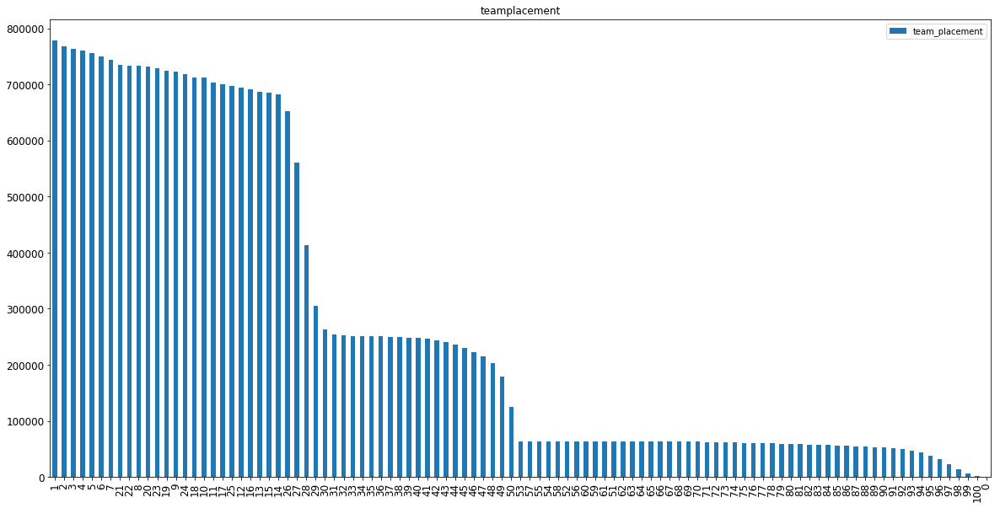

In [24]:
ax = pd.value_counts(aggrs['team_placement']).plot(kind='bar',
                                                      title ="teamplacement",
                                                      figsize=(20, 10), legend=True, fontsize=12)

plt.show()

In [29]:
aggrs_partySize1

,date,game_size,match_id,match_mode,party_size,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_name,player_survive_time,team_id,team_placement
494,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,170.954788,0,0,Satch,186.999,100004,79
495,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,66.545590,0,0,osamabinlaggon,124.782,100005,87
496,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,728.722656,610.168945,124,0,dengboyu76,839.161,100006,35
497,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,2646.184000,1431.292000,24,0,GOGingmimi,751.716,100007,46
498,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,723.102300,100,1,AtomicBrunette,744.088,100011,47
499,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,0.000000,0,0,MIUI6,108.231,100013,90
500,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,1055.677610,1889.028000,438,4,LORD_JTR,1006.527,100022,29
501,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,927.809937,0,0,DongMing1986,741.473,100026,48
502,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,706.727400,0,0,Prima_Top,290.769,100031,67
503,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,171.162720,0,0,xxfffffff,337.259,100033,63


In [85]:
aggrs_partySize1 = aggrs[aggrs["party_size"]==1]

In [96]:
aggrs_partySize1

,date,game_size,match_id,match_mode,party_size,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_name,player_survive_time,team_id,team_placement
494,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,170.954788,0,0,Satch,186.999,100004,79
495,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,66.545590,0,0,osamabinlaggon,124.782,100005,87
496,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,728.722656,610.168945,124,0,dengboyu76,839.161,100006,35
497,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,2646.184000,1431.292000,24,0,GOGingmimi,751.716,100007,46
498,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,723.102300,100,1,AtomicBrunette,744.088,100011,47
499,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,0.000000,0,0,MIUI6,108.231,100013,90
500,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,1055.677610,1889.028000,438,4,LORD_JTR,1006.527,100022,29
501,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,927.809937,0,0,DongMing1986,741.473,100026,48
502,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,706.727400,0,0,Prima_Top,290.769,100031,67
503,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,171.162720,0,0,xxfffffff,337.259,100033,63


In [97]:
aggrs_partySize1["player_survive_time"]

494          186.999
495          124.782
496          839.161
497          751.716
498          744.088
499          108.231
500         1006.527
501          741.473
502          290.769
503          337.259
504         1020.411
505          214.808
506          165.839
507          665.444
508          125.975
509         1111.732
510          345.475
511          426.540
512          249.322
513         1010.649
514         1958.935
515          199.623
516          351.842
517         1123.503
518          772.476
519         1335.668
520          799.851
521          936.479
522          764.254
523          248.997
              ...   
13844046     761.969
13844047    1195.599
13844048    1516.951
13844049    1539.868
13844050    1488.491
13844051    1607.701
13844052     148.080
13844053     329.787
13844054     243.297
13844055     226.642
13844056     159.898
13844057     376.651
13844058     449.082
13844059     710.534
13844060     235.637
13844061     566.898
13844062    1

## Arme la plus utilisée par les derniers en solo

In [124]:
deaths

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
0,Grenade,KrazyPortuguese,5.0,657725.10,146275.2,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,823,KrazyPortuguese,5.0,657725.10,146275.2
1,SCAR-L,nide2Bxiaojiejie,31.0,93091.37,722236.4,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,194,X3evolution,33.0,92238.68,723375.1
2,S686,Ascholes,43.0,366921.40,421623.9,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,103,CtrlZee,46.0,367304.50,421216.1
3,Down and Out,Weirdo7777,9.0,472014.20,313274.8,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,BlackDpre,13.0,476645.90,316758.4
4,M416,Solayuki1,9.0,473357.80,318340.5,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,Vjolt,13.0,473588.50,318418.8
5,Punch,xuezhiqian717,26.0,721944.40,359575.3,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,123,PurplePenguin9,47.0,0.00,0.0
6,AKM,pdfjkkvjk,12.0,376333.80,317858.9,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,886,JoeyJoeman,15.0,372808.30,297124.2
7,S686,xiaogao13,27.0,373125.30,433540.6,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,137,BNOISE,38.0,373125.80,433608.8
8,S686,Jingchita,40.0,370990.60,424074.5,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,89,OmGiTzPauly,47.0,370761.10,423662.1
9,AKM,Alexande-999,25.0,368799.30,420810.2,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,117,Ascholes,43.0,368015.00,421322.6


In [ ]:
miramar = deaths[deaths["map"] == "MIRAMAR"]

In [128]:
#On prend le premier dans la partie
deathsby1 = deaths[deaths['killer_placement']==1]

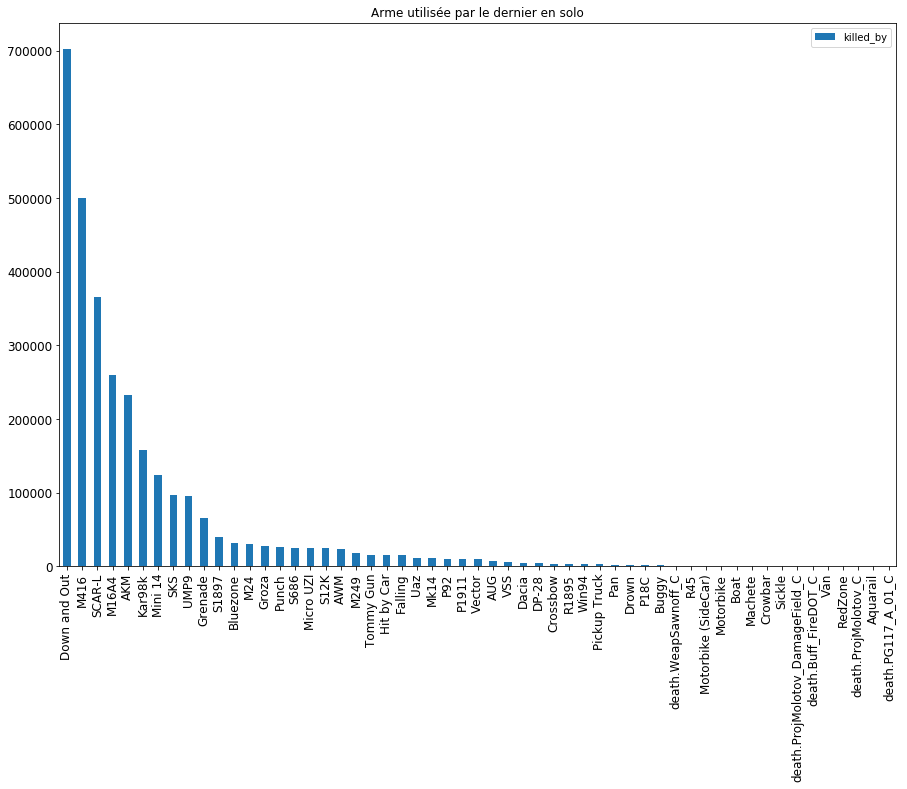

In [133]:
ax = pd.value_counts(deathsby1['killed_by']).plot(kind='bar', title ="Arme utilisée par le dernier en solo", figsize=(15, 10), legend=True, fontsize=12)

plt.show()

In [136]:
#On cherche quand est ce qu'il a eu le deuxième

deathsby1kill2= deathsby1[deathsby1['victim_placement']==2]

In [140]:
deathsby1kill2Test = deathsby1kill2[deathsby1kill2['killed_by']=='Down and Out']

In [141]:
deathsby1kill2Test

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
359,Down and Out,Illmy0111,1.0,174635.6,510872.2,ERANGEL,2U4GBNA0YmlxiifTmjHuCGJhLNLL-lhlH9TQh47o-9IZVJ...,1640,fairyGIGI,2.0,166706.2,538946.3
433,Down and Out,VSUPciwei,1.0,396289.3,308352.7,ERANGEL,2U4GBNA0YmmLlZbT02zMNt2JlWQ2eYFKRG02TGemIK1RM2...,1864,Ursdad666,2.0,394014.9,303887.9
560,Down and Out,Teajohn,1.0,391571.3,654292.6,ERANGEL,2U4GBNA0YmnL2IDzaNwyjj2JugGFn9rAVCHGV0UvWrWIov...,1824,Chubby_Cox,2.0,403164.2,645289.1
642,Down and Out,ConnorDaWhiteBoy,1.0,698468.9,254960.2,ERANGEL,2U4GBNA0YmnZDcOwRYKzxWhbr5Jaxxjhp0cRvsI40iOQJd...,1827,Tomwillbetom,2.0,682834.8,259266.8
1083,Down and Out,tanyangwudi,1.0,486249.4,601901.4,ERANGEL,2U4GBNA0Ymkoxr2BYKn-rNaRztbwuI_vg9q1ls65L42rey...,1735,SSS109,2.0,490525.7,593473.2
1092,Down and Out,Toronto_Edision,1.0,320935.6,510978.1,ERANGEL,2U4GBNA0YmnmvI29GR080nJ5U4oZyrJ2kJqz7BeQrwDdx6...,1767,EncoreOnceMore,2.0,318386.9,511889.4
1106,Down and Out,Toronto_JackMa,1.0,324418.0,514533.8,ERANGEL,2U4GBNA0YmnmvI29GR080nJ5U4oZyrJ2kJqz7BeQrwDdx6...,1767,sortiedog,2.0,322706.4,514567.9
1114,Down and Out,Toronto_Edision,1.0,318993.6,510673.3,ERANGEL,2U4GBNA0YmnmvI29GR080nJ5U4oZyrJ2kJqz7BeQrwDdx6...,1762,YUNGNIGE,2.0,317324.4,511276.0
1847,Down and Out,Blesstfup,1.0,661589.5,465149.0,ERANGEL,2U4GBNA0Ymmj5ChhNizFBQNzal-aacFtZr3MhwiNw8qBDJ...,1955,UrbanSnake,2.0,658512.8,461169.9
1946,Down and Out,RX-JIANG,1.0,395072.9,135601.3,ERANGEL,2U4GBNA0YmkJt4dyUUT94MOYESuKm2MQu1eh08EFdbeeGC...,1795,SeththeRipper,2.0,406248.1,138302.7


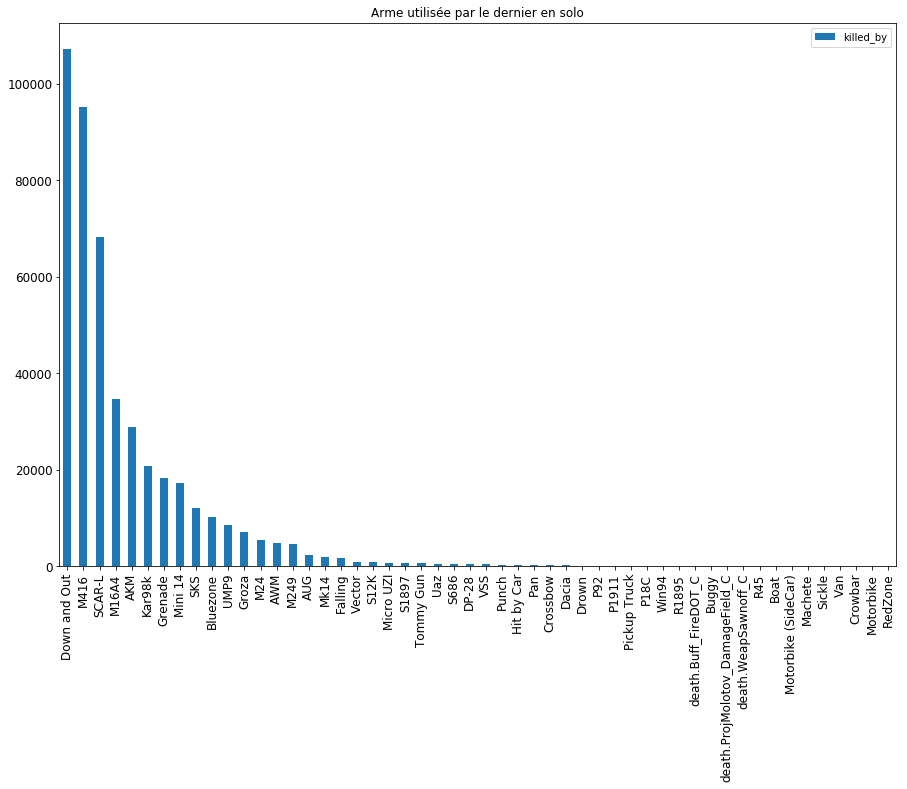

In [132]:
ax = pd.value_counts(deathsby1kill2['killed_by']).plot(kind='bar', title ="Arme utilisée par le dernier en solo", figsize=(15, 10), legend=True, fontsize=12)

plt.show()

## Temps de survie

KeyboardInterrupt: 

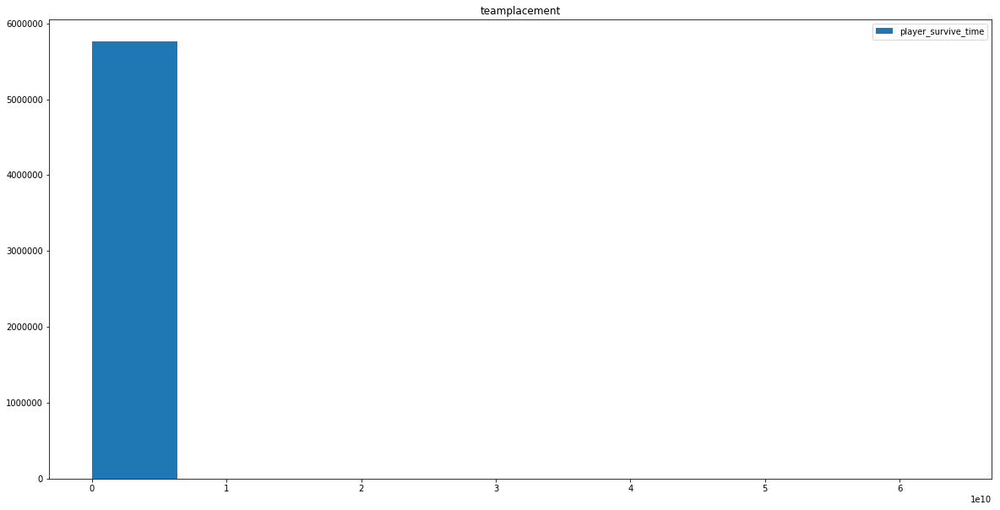

In [122]:
aggrs_partySize1["player_survive_time"].plot(kind='hist',
                                                      title ="teamplacement",
                                                      
                                                      figsize=(20, 10), legend=True, fontsize=12)

In [100]:
aggrs_partySize1["player_survive_time"].max()

63647875100.0

In [102]:
aggrs_partySize1["player_survive_time"].mean()

155359.41220681847

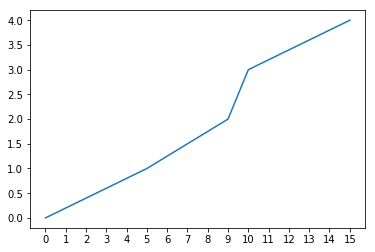

In [110]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

x = [0,5,9,10,15]
y = [0,1,2,3,4]

tick_spacing = 1

fig, ax = plt.subplots(1,1)
ax.plot(x,y)
ax.xaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
plt.show()

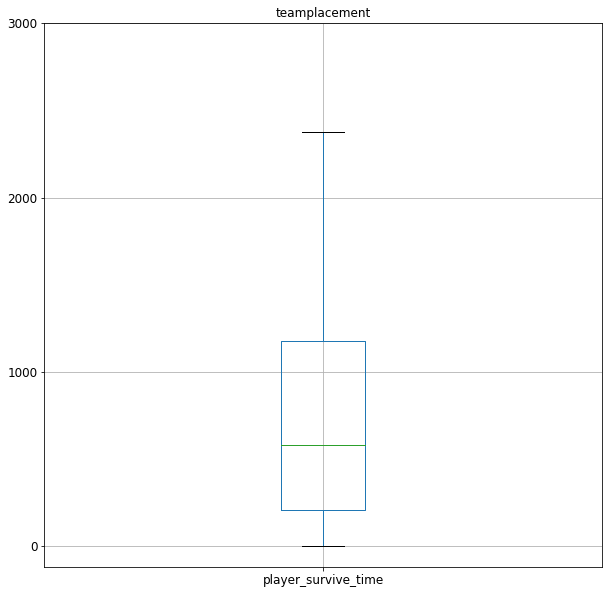

In [119]:
aggrs_partySize1["player_survive_time"].plot(kind='box',
       title ="teamplacement",
       showfliers=False,
        grid=True,
        yticks=[0,1000,2000,3000],
       layout=(2000,100),
       figsize=(10, 10), legend=True, fontsize=12)


In [142]:
aggrs_partySize1

,date,game_size,match_id,match_mode,party_size,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_name,player_survive_time,team_id,team_placement
494,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,170.954788,0,0,Satch,186.999,100004,79
495,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,66.545590,0,0,osamabinlaggon,124.782,100005,87
496,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,728.722656,610.168945,124,0,dengboyu76,839.161,100006,35
497,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,2646.184000,1431.292000,24,0,GOGingmimi,751.716,100007,46
498,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,723.102300,100,1,AtomicBrunette,744.088,100011,47
499,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,0.000000,0,0,MIUI6,108.231,100013,90
500,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,1055.677610,1889.028000,438,4,LORD_JTR,1006.527,100022,29
501,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,927.809937,0,0,DongMing1986,741.473,100026,48
502,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,706.727400,0,0,Prima_Top,290.769,100031,67
503,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,171.162720,0,0,xxfffffff,337.259,100033,63


In [146]:
q = aggrs_partySize1["player_survive_time"].quantile(0.99)
tes = aggrs_partySize1[aggrs_partySize1["player_survive_time"] < q]

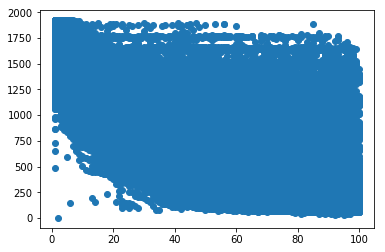

In [147]:
plt.scatter(tes['team_placement'],tes['player_survive_time'])

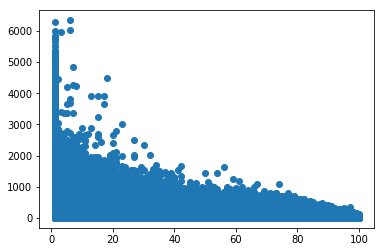

In [148]:
plt.scatter(tes['team_placement'],tes['player_dmg'])

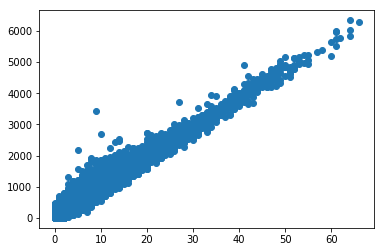

In [149]:
plt.scatter(tes['player_kills'],tes['player_dmg'])

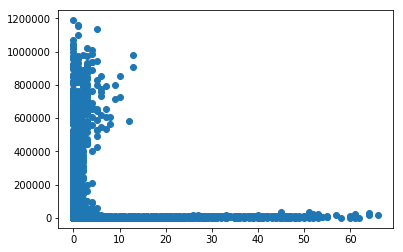

In [151]:
plt.scatter(tes['player_kills'],tes['player_dist_walk'])

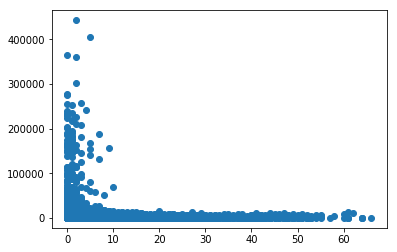

In [152]:
plt.scatter(tes['player_kills'],tes['player_dist_ride'])

In [154]:
tesr = tes[tes['player_dist_ride']>0]

In [155]:
tesr

,date,game_size,match_id,match_mode,party_size,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_name,player_survive_time,team_id,team_placement
496,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,728.722656,610.168945,124,0,dengboyu76,839.161,100006,35
497,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,2646.184000,1431.292000,24,0,GOGingmimi,751.716,100007,46
500,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,1055.677610,1889.028000,438,4,LORD_JTR,1006.527,100022,29
504,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,6892.920000,1382.882810,60,0,dsadwada,1020.411,100034,27
511,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,1,0,1101.990720,427.561768,2,0,jordy140420,426.540,100065,58
517,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,1755.197390,2224.459470,175,1,xiaozhangcjw,1123.503,100080,20
518,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,369.883200,2282.243650,64,0,hyh981118,772.476,100085,44
519,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,742.244300,1203.649660,130,1,Timor001,1335.668,100086,26
520,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,1093.456180,1345.949340,0,0,siliymaui125,799.851,100089,42
521,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,2027.765500,541.117554,228,3,MLBBear,936.479,100002,30


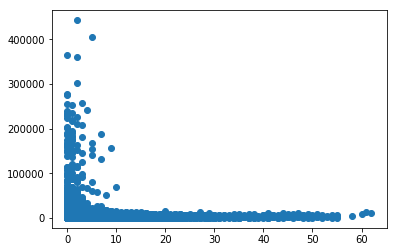

In [157]:
plt.scatter(tesr['player_kills'],tesr['player_dist_ride'])

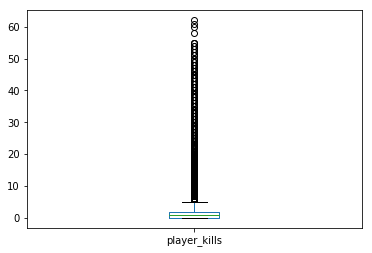

In [163]:
tesr['player_kills'].plot.box()

In [164]:
tesr['player_kills'].mean()

1.4659233404138412

In [182]:
tesr['player_kills'].quantile(0.9)

4.0

In [188]:
tesr['team_id'].quantile(0.999)

100101.0

In [150]:
tes

,date,game_size,match_id,match_mode,party_size,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_name,player_survive_time,team_id,team_placement
494,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,170.954788,0,0,Satch,186.999,100004,79
495,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,66.545590,0,0,osamabinlaggon,124.782,100005,87
496,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,728.722656,610.168945,124,0,dengboyu76,839.161,100006,35
497,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,2646.184000,1431.292000,24,0,GOGingmimi,751.716,100007,46
498,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,723.102300,100,1,AtomicBrunette,744.088,100011,47
499,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,0.000000,0,0,MIUI6,108.231,100013,90
500,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,1055.677610,1889.028000,438,4,LORD_JTR,1006.527,100022,29
501,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,927.809937,0,0,DongMing1986,741.473,100026,48
502,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,706.727400,0,0,Prima_Top,290.769,100031,67
503,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,171.162720,0,0,xxfffffff,337.259,100033,63


In [94]:
a = aggrs_partySize1.groupby('match_id')

In [95]:
a

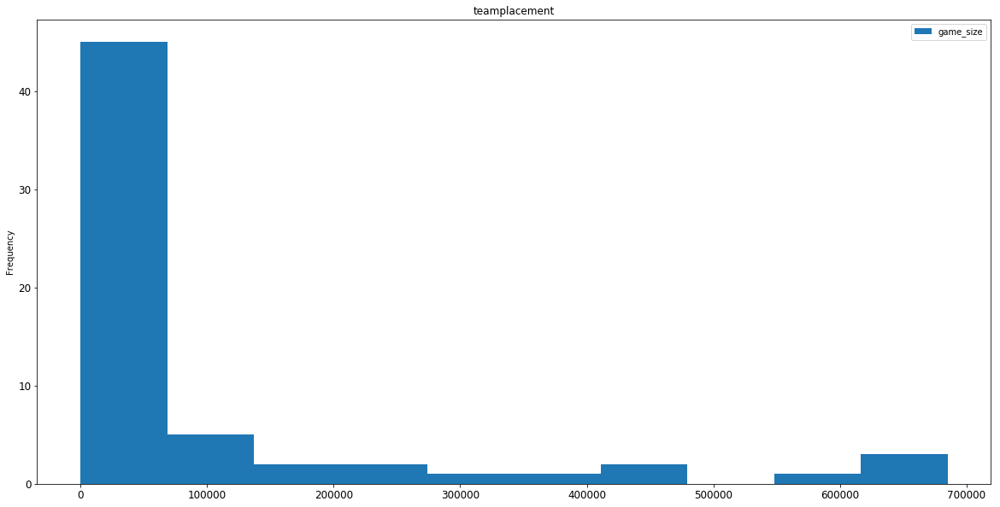

In [43]:
ax = pd.value_counts(aggrs_partySize1['game_size']).plot(kind='hist',
                                                      title ="teamplacement",
                                                      
                                                      figsize=(20, 10), legend=True, fontsize=12)

plt.show()

In [84]:
p = aggrs_partySize1['game_size'].groupby('game_size')

KeyError: 'game_size'

In [83]:
p

In [76]:
p['index2']=p.index

In [77]:
p

game_size
6                                                         6
14                                                       14
23                                                       69
25                                                       25
28                                                       28
35                                                       35
39                                                       39
42                                                       42
44                                                       34
46                                                       46
48                                                       48
49                                                       98
50                                                      200
52                                                      416
53                                                      318
54                                                      617
55                            

In [72]:
p = aggrs_partySize1.groupby("game_size",as_index=False).size()

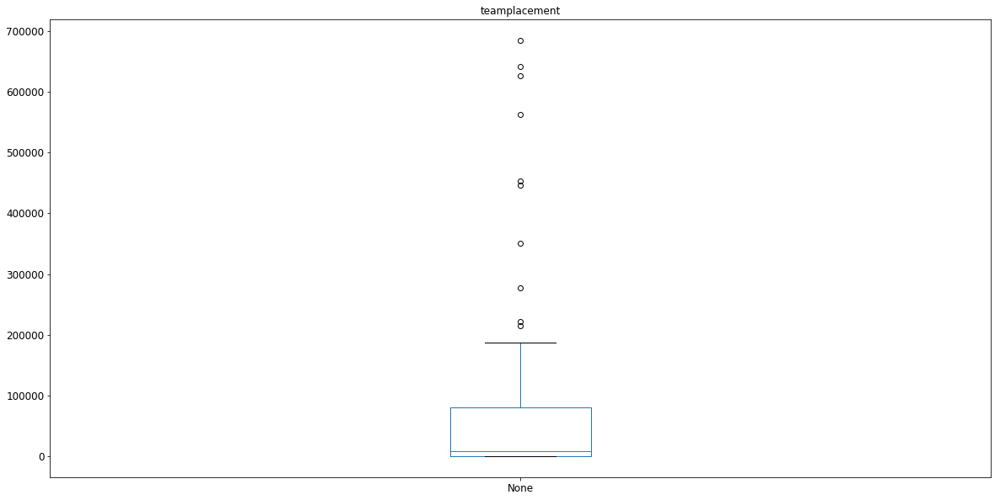

In [65]:
p.plot(kind='box',
       title ="teamplacement",                                               
       figsize=(20, 10), legend=True, fontsize=12)

In [73]:
p

game_size
6           6
14         14
23         69
25         25
28         28
35         35
39         39
42         42
44         34
46         46
48         48
49         98
50        200
52        416
53        318
54        617
55        715
56        392
57        741
58       1033
59       1180
60       1231
61       2135
62       2277
63       3213
64       3027
65       3302
66       4158
67       5024
68       6642
        ...  
71      10917
72      12082
73      13432
74      15230
75      19275
76      22192
77      25718
78      32136
79      36857
80      46364
81      51078
82      60716
83      72248
84      82788
85      94247
86     109216
87     127241
88     150202
89     186705
90     221763
91     276937
92     350774
93     453364
94     563039
95     641492
96     684941
97     627047
98     446820
99     215357
100     57399
Length: 62, dtype: int64

In [67]:
p.mean()

92941.51612903226

In [ ]:
party_size

In [ ]:
aggrs['team_id'])

In [ ]:
aggrs